# ** Neural Network Image classification**

# In this End-to-End Notebook I'll Builds Multi-class Dod Breeds classifier via classification Model

1. Problem Statement
    Identifying the dog's breathe via image of Random dog Pitcher.
2. Data
    dog-breed-identification form Kaggle.
3. Evaluation
    Evaluation is a file With predicting probabilities ofr each dog breath of each dog.
4.  Features
    We are dealing with unstructure data. We'll use deep learning and Transfer learning for predicting the probilities of the multi-class classification. We have pitchers of 120 dog's Breath.
    We have 20000 images for the traning and test sets. 10000 images with label and reaming 10000 images is without labels.


In [22]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content"

In [23]:
# !kaggle competitions download -c dog-breed-identification

In [24]:
# !unzip '/content/dog-breed-identification.zip' -d "/content/drive/MyDrive/Dog_Vision"

In [25]:
# importing the Tersor Flow in the Google Colab
import tensorflow as tf
import tensorflow_hub as hub

print('Tersorflow version is',tf.__version__)
print('Tersorflow version is',hub.__version__)
print("GPU availability in this notebook" if tf.config.list_physical_devices('GPU') else "GPU not available :(")


Tersorflow version is 2.15.0
Tersorflow version is 0.16.1
GPU not available :(


#Impoting data and coverting into Tensor beacuse for the estimators we have to convert the data into the Tensors its work with only Tensors.

In [26]:
import pandas as pd
labels_csv  = pd.read_csv('/content/drive/MyDrive/Dog_Vision/labels.csv')
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [27]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [28]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [29]:
labels_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


<Axes: >

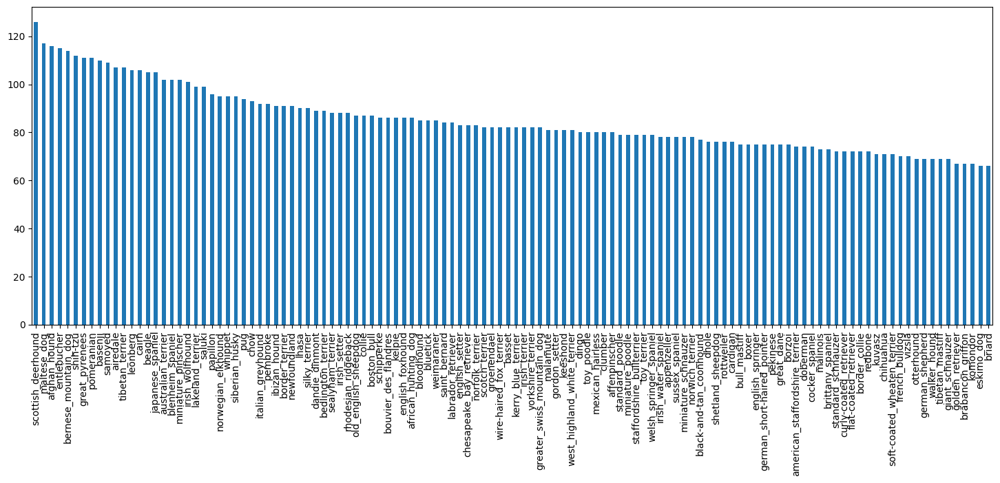

In [30]:
labels_csv.breed.value_counts().plot.bar(figsize = (18,6))

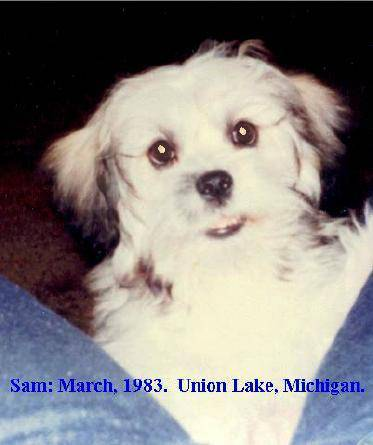

In [31]:
from IPython.display import Image

Image('/content/drive/MyDrive/Dog_Vision/train/f7a8a885e2b28630634c3fb513277f27.jpg')

In [32]:
filenames = ['/content/drive/MyDrive/Dog_Vision/train/' + fname + ".jpg" for fname in labels_csv['id']]
filenames[:10]

['/content/drive/MyDrive/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [33]:
import os
if len(os.listdir('/content/drive/MyDrive/Dog_Vision/train/')) == len(filenames):
  print("filenames matched with the actual amount of files !! Proceed")
else:
  print('filename is not matched')

filenames matched with the actual amount of files !! Proceed


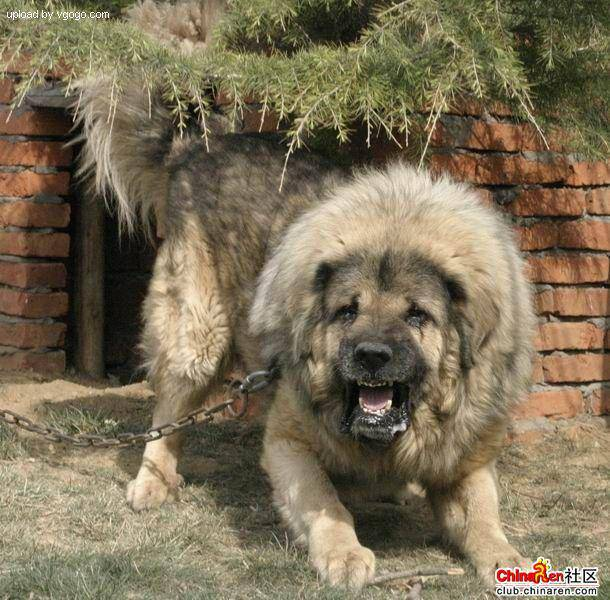

In [34]:
Image(filenames[9000])

In [35]:
labels_csv['breed'][9000]

'tibetan_mastiff'

In [36]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [37]:
import os
if len(labels) == len(filenames):
  print("filenames matched with the actual amount of files !! Proceed")
else:
  print('filename is not matched')

filenames matched with the actual amount of files !! Proceed


In [38]:
unique_breeds =np.unique(labels)
len(unique_breeds)

120

In [39]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [40]:
len(boolean_labels)

10222

In [41]:
print(labels[0])
print(np.where(unique_breeds==labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [42]:
print(labels[5])
print(boolean_labels[2].astype(int))

bedlington_terrier
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


The data dosen't comes form kaggle with validation set.
Let's make it by hand

In [43]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [44]:
X = filenames
y = boolean_labels

## We are going to start Experiments with **1000** images because Full data training takes time.

In [45]:
NUM_IMAGES  = 2000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [46]:
from sklearn.model_selection import train_test_split
# Split the total size of the NUM_IMAGES  into train and validation sets.
X_train,X_val, y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size = 0.2,
                                                 random_state = 42)

In [47]:
len(X_train),len(X_val), len(y_train),len(y_val)

(1600, 400, 1600, 400)

In [48]:
X_train[:5],y_train[:2]

(['/content/drive/MyDrive/Dog_Vision/train/17c5e8815cf0d086090a07b003b9b036.jpg',
  '/content/drive/MyDrive/Dog_Vision/train/0593e37870ee77b0d34508e118bf6670.jpg',
  '/content/drive/MyDrive/Dog_Vision/train/1428026a4472cda58ad13233bb9ad64d.jpg',
  '/content/drive/MyDrive/Dog_Vision/train/10f1d53bb20d5acc7c8772018399c238.jpg',
  '/content/drive/MyDrive/Dog_Vision/train/0a1b0b7df2918d543347050ad8b16051.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing the images into Tensors.

We are going to write the function which does few thing.
1. Take the images path as input.
2. Use the tensorflow to read the image and save it to a variable `image`.
3. Turning the image into tensors.
4. Resize the image into (224,224).
5. return modified image.


In [49]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
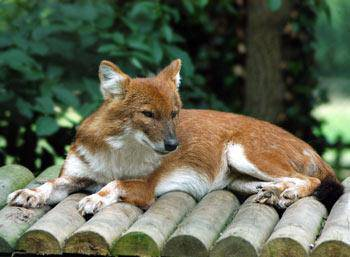

In [50]:
image

In [51]:
IMG_SIZE = 224


def process_image(image_path,img_size = IMG_SIZE):
  """
  Take a image file path and turn into Tensors
  """
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels = 3)
  image = tf.image.convert_image_dtype(image, float32)
  image = tf.image.resize(IMG_SIZE,IMG_SIZE)
  return image

Turning the data into images `batch_size` beacuse 10000 images might not fit in the RAM of Colab.
Now 32 images batch_size at a time.


In [52]:
def get_image_label(image_path):
  """
  Take a image file path name the assosciated label,
  process the image and return the image and label as well.
  """
  image = process_image(image_path)
  return image,label


Now turn our data into tuples of tensors in the form`(image, label)`,
ocnvert `X`,`Y` into Batches.


In [53]:
IMG_SIZE = 224
BATCH_SIZE = 32

def process_image(image_path, label=None, img_size=IMG_SIZE):
    """
    Take an image file path, process the image, and return it along with the label (if provided).
    """
    # Read the image file
    image = tf.io.read_file(image_path)
    # Decode the image
    image = tf.image.decode_jpeg(image, channels=3)
    # Convert the image to float32
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image to the desired size
    image = tf.image.resize(image, (img_size, img_size))

    if label is None:
        return image
    else:
        return image, label

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Create a batch of the data out of the image `(X)` and `(y)` pairs.
    Shuffle the data if it's training data but doesn't shuffle the validation data.
    Also accept the test data as input (no labels)
    """
    # If test data then we don't have labels.
    if test_data:
        print("Creating test data batch")
        data = tf.data.Dataset.from_tensor_slices(tf.constant(X))  # file paths
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch
    # Creating the validation dataset, We don't have to shuffle it.
    elif valid_data:
        print('Creating a validation dataset')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # file Paths
                                                    tf.constant(y)))  # labels for validation
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch
    else:
        print('Creating the data batches')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # file Paths
                                                    tf.constant(y)))  # labels for training
        # Shuffling pathnames and labels before mapping image processor function is faster than image shuffling
        data = data.shuffle(buffer_size=len(X))
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch


In [54]:
# Creating a traning and validation dataset.
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val, valid_data  = True )
val_data


Creating the data batches
Creating a validation dataset


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [55]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
    """
    Display the images and their labels from a data batch
    """
    plt.figure(figsize=(10, 10))
    # Loop through over 25 images
    for i in range(25):
        plt.subplot(5, 5, i + 1)  # Create subplots
        plt.imshow(images[i])
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis("off")  # Turn off axis

# Example usage:
# Assuming you have `images`, `labels`, and `unique_breeds` defined somewhere
# show_25_images(images, labels, unique_breeds)


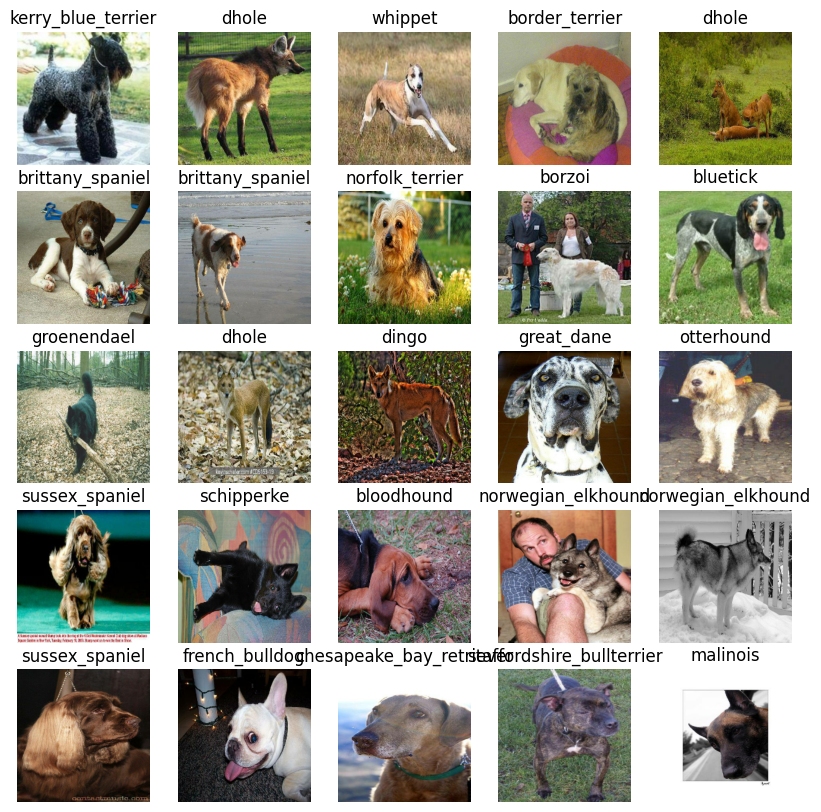

In [56]:
train_images, train_labels = next(iter(train_data.as_numpy_iterator()))
show_25_images(train_images, train_labels)


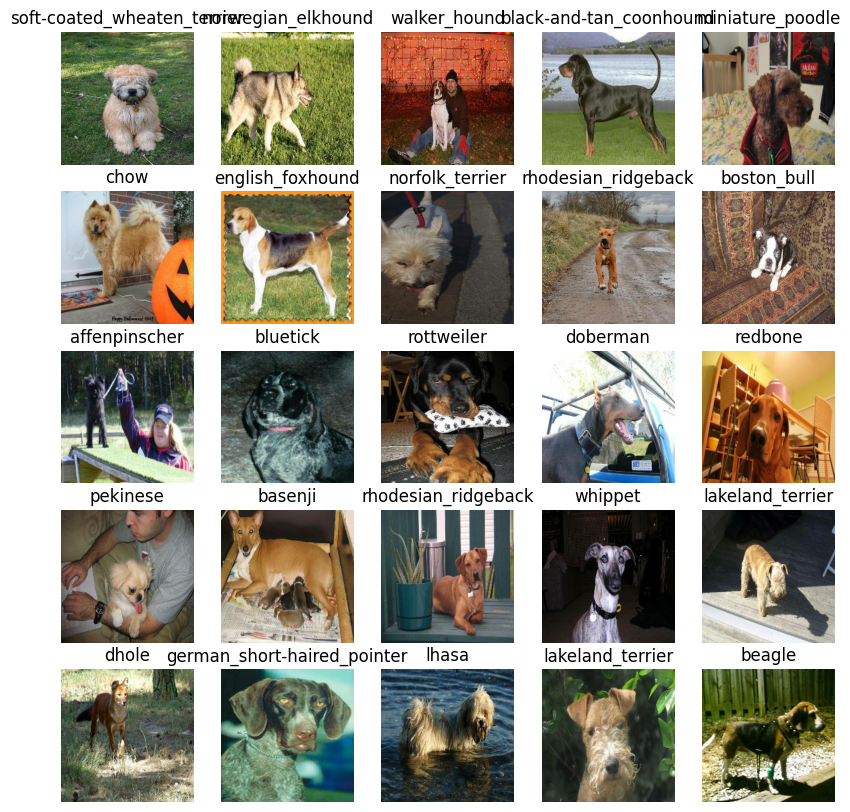

In [57]:
val_images, val_labels = next(iter(val_data.as_numpy_iterator()))
show_25_images(val_images, val_labels)


In [58]:
# Setup input shape to the model
INPUT_SHAPE = [224, 224, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [59]:
# Create a function which builds a Keras model
def create_model(input_shape=[224, 224, 3], output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Setup the model layers
    model = tf.keras.Sequential([
        # Reshape layer to add batch dimension
        tf.keras.layers.Reshape((224, 224, 3), input_shape=(224, 224, 3)),
        hub.KerasLayer(model_url),  # Layer 1 (input layer)
        tf.keras.layers.Dense(units=output_shape, activation="softmax")  # Layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

# Create an instance of the model
model = create_model()

# Display the model summary
model.summary()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 224, 224, 3)       0         
                                                                 
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [60]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_1 (Reshape)         (None, 224, 224, 3)       0         
                                                                 
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [61]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [62]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [63]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [64]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [65]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


In [66]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [67]:
# Fit the model to the data
# run when its necessary
# model = train_model()

In [68]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

Making and Evaluating  the prediction using trained model.

In [69]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

13/13 [==============================] - 430s 35s/step


array([[0.00233789, 0.00688099, 0.00161905, ..., 0.00953022, 0.02078485,
        0.00150267],
       [0.00469687, 0.01379419, 0.0059315 , ..., 0.00473641, 0.00260488,
        0.00779804],
       [0.00340701, 0.00198365, 0.10709767, ..., 0.00075425, 0.00120555,
        0.00378051],
       ...,
       [0.01411225, 0.00352576, 0.01131163, ..., 0.01252264, 0.00456   ,
        0.00587072],
       [0.0059016 , 0.00221531, 0.00196639, ..., 0.0347543 , 0.02587286,
        0.0019926 ],
       [0.00095966, 0.00226246, 0.00851445, ..., 0.00633762, 0.01618628,
        0.00206687]], dtype=float32)

In [ ]:
predictions.shape , len(y_val)

In [72]:
predictions[0]

array([0.00233789, 0.00688099, 0.00161905, 0.00170379, 0.00077865,
       0.00161177, 0.00127823, 0.00114401, 0.009851  , 0.00776499,
       0.00521317, 0.00068482, 0.00869555, 0.00237985, 0.00374775,
       0.00076481, 0.01523062, 0.00450804, 0.00453697, 0.00366769,
       0.00193734, 0.00444119, 0.00059035, 0.00120738, 0.00341083,
       0.00105569, 0.00109891, 0.00207716, 0.00300605, 0.00259691,
       0.00195077, 0.00179677, 0.00250046, 0.01200743, 0.0127795 ,
       0.01292424, 0.00534014, 0.00737753, 0.00072109, 0.02179819,
       0.00404705, 0.00432797, 0.02888703, 0.00185521, 0.03091944,
       0.00762153, 0.00481064, 0.00342055, 0.004665  , 0.07176798,
       0.01674666, 0.01740342, 0.00191227, 0.02340474, 0.00963503,
       0.00681023, 0.00187897, 0.00691171, 0.00860163, 0.00071731,
       0.00189629, 0.01873181, 0.00059435, 0.01244779, 0.00472513,
       0.00329602, 0.04606875, 0.0012453 , 0.00139353, 0.01751628,
       0.02157946, 0.0046434 , 0.04691513, 0.00460752, 0.00441

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

In [74]:
unique_breeds[113]

'walker_hound'

So right now we have to create a function to visualize the pitcher.
now we are going to create a function that's will help us to Visualize hte Prediction.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

In [76]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.28940946, 0.3325467 , 0.17568395],
         [0.2501433 , 0.29330748, 0.13644473],
         [0.2876167 , 0.3342017 , 0.17733893],
         ...,
         [0.5164206 , 0.5776601 , 0.33903962],
         [0.54773974, 0.6089793 , 0.3703588 ],
         [0.50159407, 0.56283355, 0.32421306]],
 
        [[0.27667817, 0.3276586 , 0.15903112],
         [0.30975384, 0.3608085 , 0.19218104],
         [0.33957785, 0.39721096, 0.22858347],
         ...,
         [0.491509  , 0.5575804 , 0.28604677],
         [0.5702347 , 0.6363061 , 0.36477253],
         [0.5313855 , 0.59745693, 0.32592332]],
 
        [[0.29069865, 0.35518688, 0.17861006],
         [0.29807582, 0.36118335, 0.18470922],
         [0.31007844, 0.37737536, 0.20058963],
         ...,
         [0.50055254, 0.56690407, 0.29036346],
         [0.5573835 , 0.623735  , 0.3471944 ],
         [0.55167574, 0.61802727, 0.34148666]],
 
        ...,
 
        [[0.24473517, 0.27916905, 0.13407102],
         [0.04194383, 0.08529994, 0.00537

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=44)

In [79]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now i got a way for to get:
* Predction labels
* Validation(Truth labels) labels
* Validation Images

In [ ]:
# import matplotlib.pyplot as plt
# import tensorflow as tf

# def plot_pred_and_image(prediction_probabilities, labels, images, n=1):
#     '''
#     Plot predicted labels, predicted probabilities, true labels, and images.
#     '''

#     # Plot prediction for a specific image
#     pred_prob, true_label,image = prediction_probabilities[n], labels[n],images[n]

#     pred_prob,true_label, image = prediction
#     # Determine color for the plot title based on prediction correctness
#     if pred_label == true_label:
#         color = 'green'
#     else:
#         color = 'red'

#     # Plot image and remove ticks
#     plt.imshow(image.numpy().astype("uint8"))  # Convert image to numpy array and ensure uint8 data type
#     plt.xticks([])
#     plt.yticks([])

#     # Change plot title to show predicted label, predicted probability, and true label with color coding
#     plt.title("Predicted: {} ({}%)\nTruth: {}".format(pred_label, int(max(pred_prob)*100), true_label), color=color)

#     plt.show()

# # Example usage:
# plot_pred_and_image(prediction_probabilities=prediction, labels=val_labels, images=val_images)


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

In [ ]:
len(val_images),len(val_labels), len(predictions)

In [83]:
len(val_images[0]), len(val_labels[0])

(224, 27)

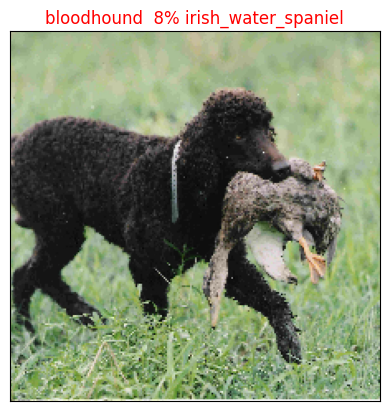

In [84]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=123)

Now we got function to view the predicted label of the given images
Now create a function to view the top 10 predicted images.
For visualization write a function

In [85]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    We are writing a function for the 10 prediction probabilities
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 predictions
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # predictions[0][predictions[0].argsort()[-10:][::-1]]
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey",
                       )
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")

    # Change color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass


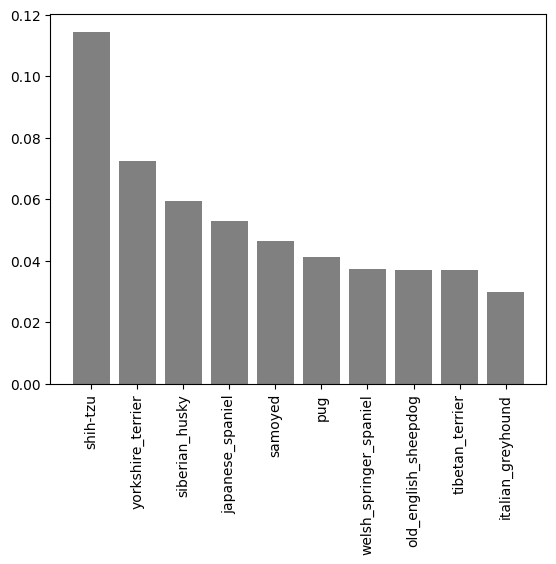

In [86]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels , n=9)

In [87]:
# Chatgpt ploting code
def plot_top_10_predictions(prediction_probabilities, labels, images, n=1):
    """
    Plot the top 10 predicted probabilities along with their respective images.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 predictions
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Plot the top 10 predictions along with their images
    fig, axes = plt.subplots(2, 5, figsize=(15, 8))
    fig.subplots_adjust(hspace=0.5, wspace=0.5)
    axes = axes.ravel()

    for i, (pred_label, pred_prob, image) in enumerate(zip(top_10_pred_labels, top_10_pred_values, images)):
        ax = axes[i]
        ax.imshow(image)
        ax.set_title("{}\n{}: {:.2f}%".format(pred_label, "Correct" if pred_label == true_label else "Incorrect", pred_prob * 100))
        ax.axis('off')

    plt.show()


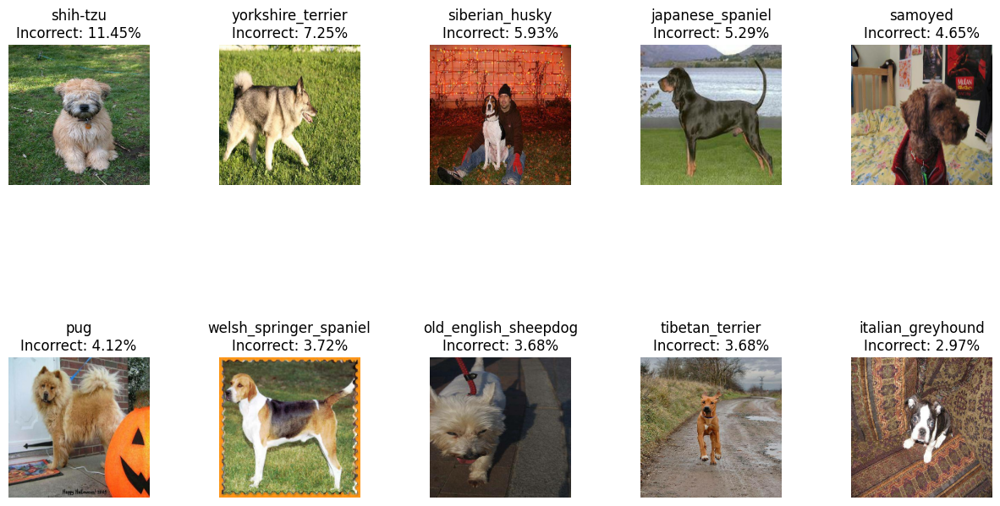

In [88]:
plot_top_10_predictions(prediction_probabilities = predictions,
              images=val_images, labels = val_labels , n=9)

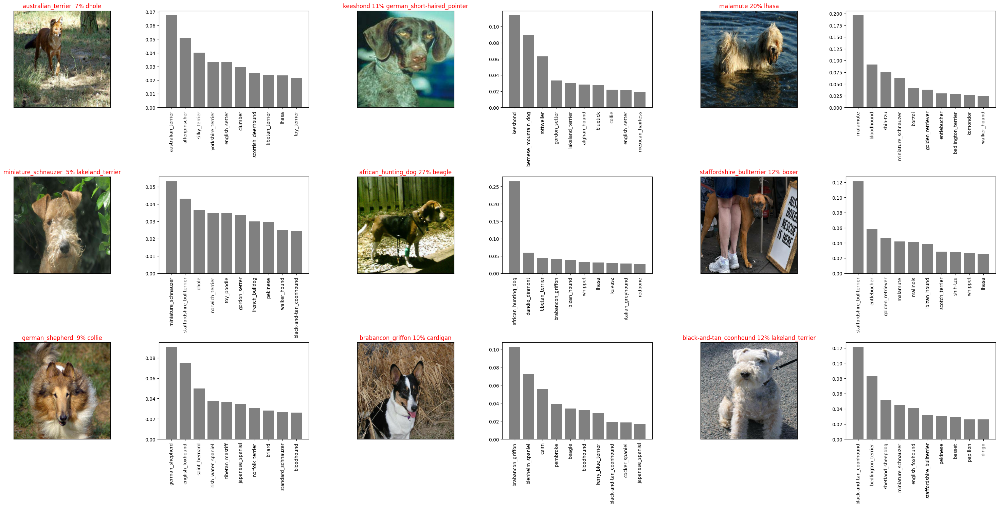

In [89]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Create a Function to save the model

In [90]:
# ppend a suffix

In [91]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [92]:
def load_model(model_path):
  '''
  load and retrain the model from its given path
  '''
  print(f"Loading Saved model from:{model_path}...")
  model = tf.keras.models.load_model( model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})

  return model



In [93]:
save_model(model, suffix  ="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240315-15481710517738-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240315-15481710517738-1000-images-mobilenetv2-Adam.h5'

# Load trained model
Next time Don't run all cells of the model ran calles from here

In [94]:
load_1000_images_trained_model = load_model('drive/My Drive/Dog Vision/models/20240313-19561710359765-1000-images-mobilenetv2-Adam.h5')

Loading Saved model from:drive/My Drive/Dog Vision/models/20240313-19561710359765-1000-images-mobilenetv2-Adam.h5...


In [95]:
# Evaluate trained model
model.evaluate(val_data)

13/13 [==============================] - 24s 2s/step - loss: 5.8491 - accuracy: 0.0050


[5.849099159240723, 0.004999999888241291]

In [96]:
load_1000_images_trained_model.evaluate(val_data)

13/13 [==============================] - 21s 2s/step - loss: 0.8164 - accuracy: 0.7750


[0.8163741827011108, 0.7749999761581421]

#Now its time to train the model on the whole dataset.

In [97]:
len(X), len(y)

(10222, 10222)

In [98]:
full_data = create_data_batches(X,y)

Creating the data batches


In [99]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [100]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


# Create full model call backs
full_model_tensorboard = create_tensorboard_callback()
# Now we did'nt load the test data so we have to stop the model traning when there will no improvement.
# we can use here early stopping.



In [101]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# early stopping
full_model_early_stopping  = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",

                                                              patience  = 3)

#Note:- the below cell takes more time to complete(hours or day) beacuse GUP or TPU has to load all images data.

In [102]:
# full_model.fit(x = full_data,
#                epochs = NUM_EPOCHS,
#                callbacks = [full_model_tensorboard,full_model_early_stopping])

In [ ]:
save_model(full_model, suffix  ="full data-images-mobilenetv2-Adam")

#Loading the full model

In [124]:
full_trained_model = load_model("drive/My Drive/Dog Vision/models/20240314-21041710450241-full data-images-mobilenetv2-Adam.h5")

Loading Saved model from:drive/My Drive/Dog Vision/models/20240314-21041710450241-full data-images-mobilenetv2-Adam.h5...


In [125]:
full_trained_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_3 (Reshape)         (None, 224, 224, 3)       0         
                                                                 
 keras_layer_3 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_3 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Making the prediction on the test data
We have to make our test data in the same format as the traning data like in the tesors.

We already make function for doing the preprocessing the images. We'll only call the images.
* Get images data via filenames
* calling the `create_data_batch()` function and setting the `test data` parameter true(since test data dosent has labels)
* Make the prediction by passing the test batch to `Predict()` function.

In [105]:
# Load test image filenames
file_path = '/content/drive/MyDrive/Dog_Vision/test'

test_filenames = ['/content/drive/MyDrive/Dog_Vision/test' + fname for fname in os.listdir(file_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog_Vision/teste646ac89e0832502f9a726c72773cfcc.jpg',
 '/content/drive/MyDrive/Dog_Vision/teste2844bf76c0ddeae02277d76c31e41f5.jpg',
 '/content/drive/MyDrive/Dog_Vision/teste334f758c7944df19c98d49498d28c64.jpg',
 '/content/drive/MyDrive/Dog_Vision/teste745d75a74a9cbdc917e7775febd88e8.jpg',
 '/content/drive/MyDrive/Dog_Vision/teste46a2bfb7816324d171c4e07786abc59.jpg',
 '/content/drive/MyDrive/Dog_Vision/teste71fde4ddc4c1adf9b4cf397e3904f74.jpg',
 '/content/drive/MyDrive/Dog_Vision/teste73dc6a8f2d7c941f28c0a5298bc5bdc.jpg',
 '/content/drive/MyDrive/Dog_Vision/teste55fa0c818f485f8e36edfb464c4f129.jpg',
 '/content/drive/MyDrive/Dog_Vision/testde291f05facd9c7db8d4880a0c84263b.jpg',
 '/content/drive/MyDrive/Dog_Vision/testdcb6ce994241db517c1ebe42897db826.jpg']

# Create the test data batch
test_data = create_data_batches(test_filenames, test_data=True)
test_data, val_data

Its will take a long time beacuse we call here predict function
and pass it full train data that's mean it has to predict the label (breeds) of 10357 pictures

In [106]:
test_data =  create_data_batches(test_filenames, test_data=True)
test_data


Creating test data batch


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [107]:
import os
import numpy as np
import tensorflow as tf

def load_and_preprocess_test_data(file_path):
    """
    Load and preprocess test data from the specified file path.
    """
    # Create a list of file paths for test images
    test_filenames = [os.path.join(file_path, fname) for fname in os.listdir(file_path)]

    # Create data batches
    test_data = create_data_batches(test_filenames, test_data=True)

    return test_data

def make_predictions(model, test_data):
    """
    Make predictions using the provided model on the test data.
    """
    try:
        # Make predictions
        test_predictions = model.predict(test_data, verbose=1)
        return test_predictions
    except Exception as e:
        print("An error occurred during prediction:", e)
        return None

# Define the file path for test data
file_path = '/content/drive/MyDrive/Dog_Vision/test'

# Load and preprocess test data
test_data = load_and_preprocess_test_data(file_path)

# Make predictions using the fully trained model
if test_data is not None:
    test_predictions = make_predictions(full_trained_model, test_data)
    if test_predictions is not None:
        print("Predictions made successfully.")


Creating test data batch
324/324 [==============================] - 984s 3s/step
Predictions made successfully.


In [108]:
import os

file_path = '/content/drive/MyDrive/Dog_Vision/test'

if os.path.exists(file_path):
    print("File exists.")
else:
    print("File does not exist.")


File exists.


Preparing the test data preditions for Kaggle
We have to make the DataFrame with Image 'ID' columns and with probablities.

In [113]:
pred_df = pd.DataFrame(columns = 'id'+ (unique_breeds))
pred_df.head()

,idaffenpinscher,idafghan_hound,idafrican_hunting_dog,idairedale,idamerican_staffordshire_terrier,idappenzeller,idaustralian_terrier,idbasenji,idbasset,idbeagle,...,idtoy_poodle,idtoy_terrier,idvizsla,idwalker_hound,idweimaraner,idwelsh_springer_spaniel,idwest_highland_white_terrier,idwhippet,idwire-haired_fox_terrier,idyorkshire_terrier


In [115]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(file_path)]
pred_df["id"] = test_ids

In [117]:
pred_df.head()

,idaffenpinscher,idafghan_hound,idafrican_hunting_dog,idairedale,idamerican_staffordshire_terrier,idappenzeller,idaustralian_terrier,idbasenji,idbasset,idbeagle,...,idtoy_terrier,idvizsla,idwalker_hound,idweimaraner,idwelsh_springer_spaniel,idwest_highland_white_terrier,idwhippet,idwire-haired_fox_terrier,idyorkshire_terrier,id
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e646ac89e0832502f9a726c72773cfcc
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e2844bf76c0ddeae02277d76c31e41f5
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e334f758c7944df19c98d49498d28c64
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e745d75a74a9cbdc917e7775febd88e8
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,e46a2bfb7816324d171c4e07786abc59


In [118]:
# Add the prediction probabilities to each dog breed column
pred_df[list(unique_breeds)] = test_predictions
pred_df.head()

<ipython-input-118-855c93fc9154>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  pred_df[list(unique_breeds)] = test_predictions
<ipython-input-118-855c93fc9154>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  pred_df[list(unique_breeds)] = test_predictions
<ipython-input-118-855c93fc9154>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmente

,idaffenpinscher,idafghan_hound,idafrican_hunting_dog,idairedale,idamerican_staffordshire_terrier,idappenzeller,idaustralian_terrier,idbasenji,idbasset,idbeagle,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.116836e-03,2.418924e-06,1.992679e-08,2.164720e-05,3.601618e-09,4.450209e-07,2.522057e-04,3.844317e-06,3.490622e-05,1.372792e-05
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.561905e-06,7.521017e-05,1.414460e-14,3.129285e-16,4.361093e-10,1.910025e-12,2.371099e-13,1.879378e-06,1.539119e-12,1.843155e-09
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.977000e-05,5.844915e-07,7.411802e-08,1.201675e-09,2.085874e-09,1.179894e-09,5.255188e-06,2.043469e-10,2.491580e-06,2.379891e-08
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.114490e-07,1.562723e-09,1.767376e-05,2.461839e-06,3.504716e-10,5.503288e-11,6.533004e-13,3.550939e-12,1.139697e-11,6.520381e-13
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.281048e-07,4.147967e-10,9.047191e-11,9.173823e-13,3.388432e-09,8.896879e-14,1.444986e-11,5.643766e-11,1.717498e-09,5.485868e-12


In [119]:
pred_df.to_csv("drive/MyDrive/Dog_Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [152]:
# Get custom image filepaths
custom_path = '/content/drive/MyDrive/Custom_path/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [153]:
custom_image_paths

['/content/drive/MyDrive/Custom_path/Screenshot 2024-03-15 220715.png',
 '/content/drive/MyDrive/Custom_path/Screenshot 2024-03-15 220723.png',
 '/content/drive/MyDrive/Custom_path/Screenshot 2024-03-15 220737.png',
 '/content/drive/MyDrive/Custom_path/Screenshot 2024-03-15 220743.png',
 '/content/drive/MyDrive/Custom_path/Screenshot 2024-03-15 223030.png',
 '/content/drive/MyDrive/Custom_path/Screenshot 2024-03-15 223308.png',
 '/content/drive/MyDrive/Custom_path/Screenshot 2024-03-15 224041.png',
 '/content/drive/MyDrive/Custom_path/Screenshot 2024-03-15 225900.png']

In [154]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batch


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [155]:
# Make predictions on the custom data
custom_preds = full_trained_model.predict(custom_data)

1/1 [==============================] - 0s 390ms/step


In [156]:
custom_preds.shape

(8, 120)

In [157]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['walker_hound',
 'shih-tzu',
 'afghan_hound',
 'eskimo_dog',
 'golden_retriever',
 'great_pyrenees',
 'appenzeller',
 'scottish_deerhound']

In [158]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

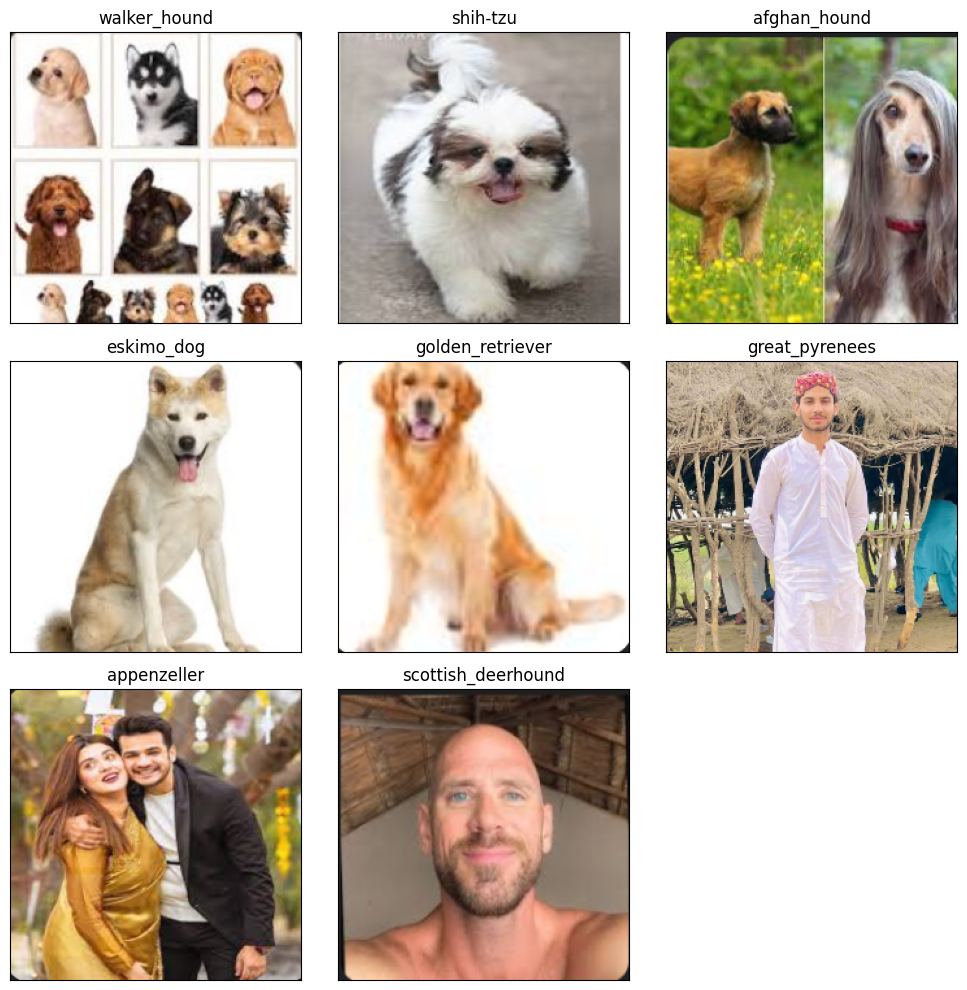

In [159]:
# Check custom image predictions
num_images = len(custom_images)
num_rows = (num_images + 2) // 3  # Calculate the number of rows needed based on the number of images
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(num_rows, 3, i + 1)  # Adjust the number of columns to always be 3
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)
plt.tight_layout()
plt.show()
